<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Задача" data-toc-modified-id="Задача-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Задача</a></span></li><li><span><a href="#Загрузки" data-toc-modified-id="Загрузки-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Загрузки</a></span></li><li><span><a href="#EDA" data-toc-modified-id="EDA-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>EDA</a></span></li><li><span><a href="#Заполняем-пропуски" data-toc-modified-id="Заполняем-пропуски-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Заполняем пропуски</a></span></li><li><span><a href="#Строим-графики" data-toc-modified-id="Строим-графики-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Строим графики</a></span></li><li><span><a href="#Анализ-торговых-стратегий" data-toc-modified-id="Анализ-торговых-стратегий-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Анализ торговых стратегий</a></span><ul class="toc-item"><li><span><a href="#Создаем-df-для-работы" data-toc-modified-id="Создаем-df-для-работы-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>Создаем df для работы</a></span></li><li><span><a href="#Тест?" data-toc-modified-id="Тест?-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Тест?</a></span></li></ul></li></ul></div>

# Предварительный анализ задачи торговой стратегии

## Задача

1. Загрузить данные о котировках ценных бумаг из списка SnP500 и котировки криптовалют (BTC, ETH, SOL, XRP).

2. Подготовьте автоматическое отображение графиков текущей ситуации.

3. Проверьть пропуски и ошибки. 

4. Проверить Backtest'ом простую стратегию.

## Загрузки

In [1]:
'''Системные'''
import os
from datetime import datetime, timedelta
from tqdm import tqdm 

'''База'''
import talib
from backtesting.lib import crossover
import yfinance as yf
import pandas as pd
import numpy as np
from itertools import chain, combinations


'''Графики'''
from plotly.subplots import make_subplots
import plotly.express as px
import plotly.graph_objects as go
import dash
from dash import dcc, html
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns

'''Обучение'''
import lightgbm as lgb
from lightgbm import LGBMClassifier
from lightgbm import early_stopping
from sklearn.ensemble import RandomForestClassifier
from catboost import CatBoostClassifier
import optuna

'''Подготовка'''
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import (
    classification_report, 
    accuracy_score, 
    f1_score, 
    confusion_matrix, 
    )
from sklearn.preprocessing import StandardScaler


# Настройка уровня логирования Optuna
import logging
# optuna.logging.set_verbosity(optuna.logging.ERROR)
# logging.getLogger('lightgbm').setLevel(logging.ERROR)
import sys

'''Торговые агенты'''
from backtesting import Backtest, Strategy

# # Сохранение оригинального stdout
# original_stdout = sys.stdout

# # Перенаправление stdout в null
# sys.stdout = open(os.devnull, 'w')

C:\YandexDisk\Code\.neural_env\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
C:\YandexDisk\Code\.neural_env\lib\site-packages\backtesting\_plotting.py:50: UserWarning: Jupyter Notebook detected. Setting Bokeh output to notebook. This may not work in Jupyter clients without JavaScript support (e.g. PyCharm, Spyder IDE). Reset with `backtesting.set_bokeh_output(notebook=False)`.
  warnings.warn('Jupyter Notebook detected. '


Loading BokehJS ...

In [2]:
print(lgb.__version__)

4.5.0


In [3]:
tickers_crypt = ['BTC-USD', 'ETH-USD', 'SOL-USD', 'XRP-USD']
output_crypt_file = 'crypto_data.csv'
output_file = 'snp500_data.csv'
all_data = []
all_data_crypt = []
end_date = datetime.today().strftime('%Y-%m-%d')
start_date = (datetime.today() - timedelta(days=(1. * 365))).strftime('%Y-%m-%d')

# Константы комиссий
COMMISSION_BUY = 0.0003
COMMISSION_SELL = 0.0002

N = 3

In [4]:
if os.path.exists(output_file):
    data = pd.read_csv(output_file, index_col=0)
    print("Данные успешно загружены:")
    display(data.head()) 

else:

    url = "https://en.wikipedia.org/wiki/List_of_S%26P_500_companies"

    table = pd.read_html(url)[0]
    tickers = table['Symbol'].tolist()[:2]
    print(f"Всего {len(tickers)} тикеров.")

    for ticker in tqdm(tickers, desc="Загрузка данных", unit="тикер"):
        try:
            data_temp = yf.download(ticker, start=start_date, end=end_date, progress=False, interval='1h')
            if isinstance(data_temp.columns, pd.MultiIndex):
                data_temp.columns = data_temp.columns.droplevel([1])
            data_temp = data_temp.reset_index(drop=False)
#             if 'Price' in data_temp.index.names:
#                 data_temp.index = data_temp.index.droplevel('Price')
            data_temp.index.name = 'Price'
#             data_temp.rename_axis(None, inplace=True)
            data_temp.columns.name = None
            data_temp['Ticker'] = ticker
            data_temp = data_temp.reset_index(drop=True)
#             data_temp = data_temp.set_index('Date')
#             display(data_temp)
            all_data.append(data_temp)
        except Exception as e:
            print(f"Ошибка в тикере {ticker}: {e}")

    if all_data:
        data = pd.concat(all_data, axis=0, ignore_index=True)
        data.to_csv(output_file)
        print(f"Данные сохранены в {output_file}")
    else:
        print("Нет данных.")
        

Данные успешно загружены:


,Datetime,Close,High,Low,Open,Volume,Ticker
0,2024-01-22 14:30:00+00:00,91.195656,91.475754,90.510033,90.719063,871030,MMM
1,2024-01-22 15:30:00+00:00,90.781769,91.220734,90.426422,91.187294,551556,MMM
2,2024-01-22 16:30:00+00:00,90.752510,90.877930,90.572746,90.794312,538234,MMM
3,2024-01-22 17:30:00+00:00,90.192307,90.844482,90.142143,90.727425,357962,MMM
4,2024-01-22 18:30:00+00:00,89.882942,90.234116,89.816055,90.196487,467126,MMM


In [5]:
if os.path.exists(output_crypt_file):
    # Загрузка данных из CSV
    data_crypt = pd.read_csv(output_crypt_file, index_col=0)
    print("Данные успешно загружены:")
    print(data_crypt.head())
else:
    # Загрузка данных с использованием yfinance
    all_data_crypt = []
    for ticker in tqdm(tickers_crypt, desc="Загрузка данных", unit="тикер"):
        try:
            data_temp_crypt = yf.download(ticker, start=start_date, end=end_date, progress=False, interval='1h')
            
            # Удаление уровня MultiIndex, если есть
            if isinstance(data_temp_crypt.columns, pd.MultiIndex):
                data_temp_crypt.columns = data_temp_crypt.columns.droplevel([1])
            
            data_temp_crypt = data_temp_crypt.reset_index(drop=False)
            data_temp_crypt.columns.name = None
            data_temp_crypt['Ticker'] = ticker
            
            if not data_temp_crypt.empty:
                all_data_crypt.append(data_temp_crypt)
        except Exception as e:
            print(f"Ошибка в тикере {ticker}: {e}")

    if all_data_crypt: 
        # Объединение данных и сохранение в CSV
        data_crypt = pd.concat(all_data_crypt, axis=0, ignore_index=True)
        print("Данные объединены.")
        try:
            data_crypt.to_csv(output_crypt_file, index=False)
            print(f"Данные сохранены в файл {output_crypt_file}.")
        except Exception as e:
            print(f"Ошибка при сохранении данных в файл: {e}")
    else:
        print("Нет данных.")

Данные успешно загружены:
                                  Close          High           Low  \
Datetime                                                              
2024-01-21 00:00:00+00:00  41605.625000  41693.160156  41605.625000   
2024-01-21 01:00:00+00:00  41643.636719  41690.082031  41610.289062   
2024-01-21 02:00:00+00:00  41674.480469  41682.105469  41640.269531   
2024-01-21 03:00:00+00:00  41659.898438  41701.632812  41650.644531   
2024-01-21 04:00:00+00:00  41647.207031  41659.816406  41634.273438   

                                   Open  Volume   Ticker  
Datetime                                                  
2024-01-21 00:00:00+00:00  41671.488281       0  BTC-USD  
2024-01-21 01:00:00+00:00  41616.089844       0  BTC-USD  
2024-01-21 02:00:00+00:00  41642.324219       0  BTC-USD  
2024-01-21 03:00:00+00:00  41675.628906       0  BTC-USD  
2024-01-21 04:00:00+00:00  41659.121094       0  BTC-USD  


In [6]:
all_data_crypt

[]

In [7]:
data_crypt = data_crypt.reset_index(drop=False)

In [8]:
df = pd.concat([data, data_crypt], axis=0, ignore_index=True)
df = df.rename(columns={'Datetime': 'Date'})
df

,Date,Close,High,Low,Open,Volume,Ticker
0,2024-01-22 14:30:00+00:00,91.195656,91.475754,90.510033,90.719063,871030,MMM
1,2024-01-22 15:30:00+00:00,90.781769,91.220734,90.426422,91.187294,551556,MMM
2,2024-01-22 16:30:00+00:00,90.752510,90.877930,90.572746,90.794312,538234,MMM
3,2024-01-22 17:30:00+00:00,90.192307,90.844482,90.142143,90.727425,357962,MMM
4,2024-01-22 18:30:00+00:00,89.882942,90.234116,89.816055,90.196487,467126,MMM
...,...,...,...,...,...,...,...
38507,2025-01-19 19:00:00+00:00,3.216501,3.219851,3.161733,3.164121,157613056,XRP-USD
38508,2025-01-19 20:00:00+00:00,3.184062,3.225880,3.183099,3.216558,150964224,XRP-USD
38509,2025-01-19 21:00:00+00:00,3.073359,3.184003,3.073359,3.184003,493773824,XRP-USD
38510,2025-01-19 22:00:00+00:00,3.030146,3.117652,2.980743,3.073662,1201275904,XRP-USD


## EDA

In [9]:
def viewing_statistics(df_list):
    print('Посмотрим на данные:')
    for i in table:
        if len(i) >= 3:
            display(i.sample(3))
        else:
            display(i)
        display(i.info())
        display(i.columns)
        print('\n')
table = [df]   
viewing_statistics(table)

Посмотрим на данные:


,Date,Close,High,Low,Open,Volume,Ticker
12057,2025-01-12 14:00:00+00:00,94741.984375,94900.984375,94628.093750,94632.750000,420427776,BTC-USD
1737,2025-01-17 20:30:00+00:00,141.014999,141.279999,140.649994,140.684998,1140968,MMM
11982,2025-01-09 11:00:00+00:00,93409.710938,93719.976562,93307.984375,93394.062500,0,BTC-USD


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38512 entries, 0 to 38511
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    38512 non-null  object 
 1   Close   38512 non-null  float64
 2   High    38512 non-null  float64
 3   Low     38512 non-null  float64
 4   Open    38512 non-null  float64
 5   Volume  38512 non-null  int64  
 6   Ticker  38512 non-null  object 
dtypes: float64(4), int64(1), object(2)
memory usage: 2.1+ MB


None

Index(['Date', 'Close', 'High', 'Low', 'Open', 'Volume', 'Ticker'], dtype='object')

In [10]:
print('Проверим пропуски:')
for i in table:
    display(i.isnull().mean().sort_values())

Проверим пропуски:


Date      0.0
Close     0.0
High      0.0
Low       0.0
Open      0.0
Volume    0.0
Ticker    0.0
dtype: float64

## Заполняем пропуски
пока нет, что бы не забыть оставлю.

In [11]:
df = df.fillna(method='ffill')
df = pd.DataFrame(df.replace(to_replace=0, method='ffill'))

C:\Users\fd\AppData\Local\Temp\ipykernel_15572\4089252463.py:1: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df = df.fillna(method='ffill')
C:\Users\fd\AppData\Local\Temp\ipykernel_15572\4089252463.py:2: FutureWarning: The 'method' keyword in DataFrame.replace is deprecated and will be removed in a future version.
  df = pd.DataFrame(df.replace(to_replace=0, method='ffill'))


## Строим графики

In [12]:
fig = go.Figure()

for ticker in df['Ticker'].unique():
    _ = df[df['Ticker'] == ticker].copy()
    
    '''Убираю ошибку с лишней линией, проверю дубликаты и пропуски после'''
    _ = _.drop_duplicates(subset=['Date']).sort_values(by='Date')
    if _['Close'].isnull().any():
        _['Close'] = _['Close'].fillna(method='ffill')  # Заполнение пропусков предыдущим значением
    

    _['Growth'] = (_['Close'] / _['Close'].iloc[0]) * 100  # Нормализация, первое значение = 100%
    fig.add_trace(go.Scatter(
        x=_['Date'],
        y=_['Growth'],
        mode='lines',
        name=ticker,
    ))

fig.update_layout(
    template="plotly_dark",
    title="Темпы прироста всех тикеров (нормализация к 100%)",
    title_x=0.5,
    xaxis_title="Дата",
    yaxis_title="Темп прироста (%)",
    xaxis=dict(showgrid=False),
    yaxis=dict(showgrid=False),
    font=dict(size=14),
)

fig.show()


## Анализ торговых стратегий

In [13]:
df['Ticker'].unique()


array(['MMM', 'AOS', 'BTC-USD', 'ETH-USD', 'SOL-USD', 'XRP-USD'],
      dtype=object)

### Создаем df для работы

In [14]:
_ = df.copy()

In [15]:
# df = _.copy()
# df = df[df['Ticker'] == df['Ticker'].unique().tolist()[N]].copy()
# df = df[~df.index.duplicated(keep='first')]
# df = df[~df['Date'].duplicated(keep='first')]
# df = df.sort_values(by='Date')
# df = df.reset_index(drop=True)

In [16]:
len(df)

38512

### Тест?

In [17]:
df = _.copy()
df = df[df['Ticker'] == df['Ticker'].unique().tolist()[N]].copy()
df = df[~df.index.duplicated(keep='first')]
df = df[~df['Date'].duplicated(keep='first')]
df = df.sort_values(by='Date')
df = df.reset_index(drop=True)
df["Date"] = pd.to_datetime(df["Date"])
df = df.drop(columns='Ticker')
df.columns = df.columns.str.lower()


In [18]:
# Рассчитываем TEMA и MACD
df['tema'] = talib.TEMA(df['close'], timeperiod=72)
df['ema'] = talib.EMA(df['close'], timeperiod=12) 
df['ema_signal'] = talib.EMA(df['close'], timeperiod=96)
df['macd'], df['macd_signal'], df['macd_hist'] = talib.MACD(
    df['close'], 
    fastperiod=24, 
    slowperiod=108, 
    signalperiod=60)
df = df.dropna()
# Создаем сигналы для покупки и продажи
df['signal'] = 0
df.loc[(df['macd'] > df['macd_signal']) & (df['ema'] > df['ema_signal']) & (df['close'] > df['tema']), 'signal'] = 1  # Сигнал на покупку
df.loc[(df['macd'] < df['macd_signal']) & (df['ema'] < df['ema_signal']) & (df['close'] < df['tema']), 'signal'] = -1  # Сигнал на продажу

In [19]:
# Добавим столбец где будет указан id трейда
df['action_id'] = 0
df['action_id'] = df['signal'].ne(df['signal'].shift()).cumsum()
# Разделим датафрейм на обучающую и тестовую выборки
split_value = int(len(df) * 0.5)

train_df = df.iloc[:split_value]
test_df = df.iloc[split_value:] #.reset_index(drop=True)


#Теперь  сделаем бэктест стратегии используя библиотеку backtesting
# для этого нам нужно создать класс стратегии

class TEMAStrategy(Strategy):
    def init(self):
        self.signal = self.I(lambda: self.data.Signal)
        self.previous_signal = 0

    def next(self):
        current_signal = self.signal[-1]

        if current_signal != self.previous_signal:
            if current_signal == 1:
                if self.position.is_short:
                    self.position.close()
                    
                if not self.position.is_long:
                    self.buy()
                    
            elif current_signal == -1:
                if self.position.is_long:
                    self.position.close()
                   
                if not self.position.is_short:
                    self.sell()
                    
            elif current_signal == 0:
                if self.position:
                    self.position.close()
                    

        self.previous_signal = current_signal

# Подготовка данных для бэктестинга
bt_df = train_df.copy()
bt_df.columns = bt_df.columns.str.capitalize()
bt_df.rename(columns={'Date': 'Datetime'}, inplace=True)
bt_df["Datetime"] = pd.to_datetime(bt_df["Datetime"])
bt_df.set_index('Datetime', inplace=True)

# Создаем объект класса Backtest
bt = Backtest(bt_df, TEMAStrategy, cash=1000000, commission=.002, exclusive_orders=True)

# Запускаем бэктест
stats = bt.run()

# Выводим статистику
print(stats[:27])

# выводим график
bt.plot(
    plot_equity=True,
    plot_drawdown=True,
    relative_equity=False,
)



Start                     2024-01-29 21:00:00+00:00
End                       2024-07-25 21:00:00+00:00
Duration                          178 days 00:00:00
Exposure Time [%]                         43.435525
Equity Final [$]                     1014972.047783
Equity Peak [$]                      1075807.553197
Return [%]                                 1.497205
Buy & Hold Return [%]                     37.673231
Return (Ann.) [%]                            3.0657
Volatility (Ann.) [%]                     39.868474
Sharpe Ratio                               0.076895
Sortino Ratio                              0.148528
Calmar Ratio                               0.190308
Max. Drawdown [%]                        -16.109137
Avg. Drawdown [%]                         -6.976573
Max. Drawdown Duration             82 days 12:00:00
Avg. Drawdown Duration             19 days 18:00:00
# Trades                                        187
Win Rate [%]                               24.59893
Best Trade [

C:\YandexDisk\Code\.neural_env\lib\site-packages\backtesting\_plotting.py:250: BokehDeprecationWarning:

Passing lists of formats for DatetimeTickFormatter scales was deprecated in Bokeh 3.0. Configure a single string format for each scale

C:\YandexDisk\Code\.neural_env\lib\site-packages\backtesting\_plotting.py:250: UserWarning:

DatetimeFormatter scales now only accept a single format. Using the first provided: '%d %b'

C:\YandexDisk\Code\.neural_env\lib\site-packages\backtesting\_plotting.py:250: BokehDeprecationWarning:

Passing lists of formats for DatetimeTickFormatter scales was deprecated in Bokeh 3.0. Configure a single string format for each scale

C:\YandexDisk\Code\.neural_env\lib\site-packages\backtesting\_plotting.py:250: UserWarning:

DatetimeFormatter scales now only accept a single format. Using the first provided: '%m/%Y'



GridPlot(id='p1644', ...)

In [20]:
train_df.columns

Index(['date', 'close', 'high', 'low', 'open', 'volume', 'tema', 'ema',
       'ema_signal', 'macd', 'macd_signal', 'macd_hist', 'signal',
       'action_id'],
      dtype='object')

In [21]:
# групируем по id осталяя только первые строки каждой сделки - это наши точки смены сигнала
# train_df = train_df.groupby('action_id').first().reset_index()
train_df = train_df.groupby('action_id').agg({
    'high': 'max',        # Максимальное значение в группе
    'low': 'min',         # Минимальное значение в группе
    'open': 'first',      # Первое значение в группе
    'close': 'last',      # Последнее значение в группе
    'volume': 'sum',       # Сумма значений в группе
    'date': 'count',
    'tema': 'last',  
    'ema': 'last', 
    'ema_signal': 'last',  
    'signal': 'last', 
}).reset_index()
train_df = train_df.rename(columns={'date': 'duration'})


# добавим столбец с профитом
train_df['profit'] = 0.0

# Смещаем столбцы 'close' и 'signal', чтобы получить данные следующего бара
train_df['next_close'] = train_df['close'].shift(-1)
train_df['next_signal'] = train_df['signal'].shift(-1)

# Рассчитываем PnL
train_df['profit'] = (train_df['next_close'] - train_df['close']) * train_df['signal']

# Заполняем PnL значением 0 для последнего бара, так как для него нет следующего бара
train_df['profit'].fillna(0, inplace=True)

# Удаляем вспомогательные столбцы
train_df.drop(columns=['next_close', 'next_signal'], inplace=True)

# Добавляем целевую переменную : 0 - cделка принесла убыток, 1- сделка принесла прибыль
train_df['Label'] = train_df['profit'].apply(lambda x: 1 if x >= 0 else 0)

# И оставляем только те строки где мы входили в позицию
train_df = train_df[train_df['signal'] != 0]

C:\Users\fd\AppData\Local\Temp\ipykernel_15572\1313644756.py:29: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [22]:
# Разделяем признаки и метки
X_train = train_df[['tema', 'ema', 'ema_signal', 'close', 'signal']]
y_train = train_df['Label']

# scaler = StandardScaler()      
# x_scaled = scaler.fit_transform(X_train)

model = LGBMClassifier(n_estimators=10, random_state=42, class_weight='balanced')

model.fit(
    X_train, y_train,
#     eval_set=[(X_test, y_test)],  # Валидационный набор данных
    eval_metric='auc',  # Метрика для оценки
#     early_stopping_rounds=10  # Ранняя остановка
)


# Важность признаков
feature_importance = pd.Series(model.feature_importances_, index=X_train.columns)
print("Feature Importance:\n", feature_importance.sort_values(ascending=False))

[LightGBM] [Info] Number of positive: 32, number of negative: 155
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000062 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 259
[LightGBM] [Info] Number of data points in the train set: 187, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

In [23]:
# повторяем все тоже самое с данными для теста
test_df = test_df.groupby('action_id').first().reset_index()
test_df['next_close'] = test_df['close'].shift(-1)
test_df['next_signal'] = test_df['signal'].shift(-1)
test_df['profit'] = (test_df['next_close'] - test_df['close']) * test_df['signal']
test_df['profit'].fillna(0, inplace=True)
test_df['Label'] = test_df['profit'].apply(lambda x: 1 if x >= 0 else 0)
test_df = test_df[test_df['signal'] != 0]

C:\Users\fd\AppData\Local\Temp\ipykernel_15572\845564083.py:6: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





0.6698113207547169


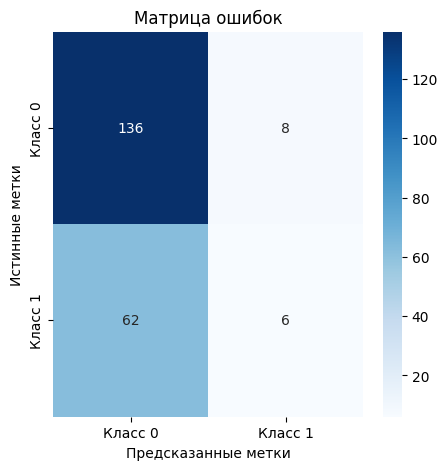

              precision    recall  f1-score   support

           0       0.69      0.94      0.80       144
           1       0.43      0.09      0.15        68

    accuracy                           0.67       212
   macro avg       0.56      0.52      0.47       212
weighted avg       0.60      0.67      0.59       212



In [24]:
# Для предсказания используем данные в столбацах ниже
X_test = test_df[['tema', 'ema', 'ema_signal', 'close', 'signal']]
y_test = test_df['Label']

# # делаем предсказание
# y_pred = model.predict(X_test)
# Предсказание вероятностей
y_pred_prob = model.predict_proba(X_test)[:, 1]

# Задаем порог
threshold = 0.6

y_pred = (y_pred_prob >= threshold).astype(int)

# выведем нашу точность
print(accuracy_score(y_test, y_pred))


# выведем нашу матрицу
cm = confusion_matrix(y_test, y_pred)

# Создаем график
plt.figure(figsize=(5, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Класс 0', 'Класс 1'], yticklabels=['Класс 0', 'Класс 1'])
plt.ylabel('Истинные метки')
plt.xlabel('Предсказанные метки')
plt.title('Матрица ошибок')
plt.show()

# выведем нашу классификационную отчет
print(classification_report(y_test, y_pred))

In [25]:
test_df['pred'] = y_pred
# test_df["date"] = pd.to_datetime(test_df["date"])
# test_df = test_df.set_index("date")
test_df['pred'] = test_df['pred']
test_df['pred'] = test_df['pred'].ffill()
test_df['Signal'] = 1

# # зануляем сделки предсказанные как убыточные
test_df.loc[(test_df['pred'] == 0), 'Signal'] = 0 # & (test_df['Signal'] != 0)
# test_df['signal'] = 0
# test_df.loc[(test_df['ema'] > test_df['ema_signal']) & (test_df['close'] > test_df['tema']), 'signal'] = 1  # Сигнал на покупку
# test_df.loc[(test_df['ema'] < test_df['ema_signal']) & (test_df['close'] < test_df['tema']), 'signal'] = -1  # Сигнал на продажу

In [26]:
test_df.Signal.unique()
# test_df

array([0, 1], dtype=int64)

In [27]:
test_df.rename(columns={'open': 'Open', 
                        'high': 'High', 
                        'low': 'Low', 
                        'close': 'Close'}, inplace=True)
bt = Backtest(test_df, TEMAStrategy, cash=1000000, commission=.002, exclusive_orders=True)

# Запускаем бэктест
stats = bt.run()

# Выводим статистику
print(stats[:27])



# выводим график
bt.plot(
    plot_equity=True,
    plot_drawdown=True,
    relative_equity=False,
)

Start                                1.0
End                                423.0
Duration                           422.0
Exposure Time [%]               8.962264
Equity Final [$]          1332296.701564
Equity Peak [$]           1365935.242953
Return [%]                      33.22967
Buy & Hold Return [%]          -3.866001
Return (Ann.) [%]                    0.0
Volatility (Ann.) [%]                NaN
Sharpe Ratio                         NaN
Sortino Ratio                        NaN
Calmar Ratio                         0.0
Max. Drawdown [%]              -2.462675
Avg. Drawdown [%]              -1.317583
Max. Drawdown Duration              30.0
Avg. Drawdown Duration               9.2
# Trades                             5.0
Win Rate [%]                        80.0
Best Trade [%]                 18.832709
Worst Trade [%]                  -2.4657
Avg. Trade [%]                  5.912911
Max. Trade Duration                 12.0
Avg. Trade Duration                  5.6
Profit Factor   

C:\YandexDisk\Code\.neural_env\lib\site-packages\backtesting\backtesting.py:1054: FutureWarning:

Index.is_numeric is deprecated. Use pandas.api.types.is_any_real_numeric_dtype instead

C:\Users\fd\AppData\Local\Temp\ipykernel_15572\840378932.py:5: UserWarning:

Data index is not datetime. Assuming simple periods, but `pd.DateTimeIndex` is advised.



GridPlot(id='p2892', ...)